In [1]:
import pandas as pd
def solution_data_normalization(u,X,t):
    data_dict={
        "u":u,
        "x":X[0],
        "y":X[1],
        "z":X[2],
        "t":t if t!=None else [None for _ in X[0]]
    }
    return pd.DataFrame(data_dict)
        
    

# Dirichlet constant F

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=1+x^2+2y^2$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [2]:
from mpi4py import MPI
from dolfinx import mesh
domain = mesh.create_unit_cube(MPI.COMM_WORLD, 64, 64, 64, mesh.CellType.hexahedron)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

In [4]:
from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: 1 + x[0]**2 + 2 * x[1]**2)

In [5]:
import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

In [6]:
import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

In [7]:
from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

In [8]:
from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [9]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


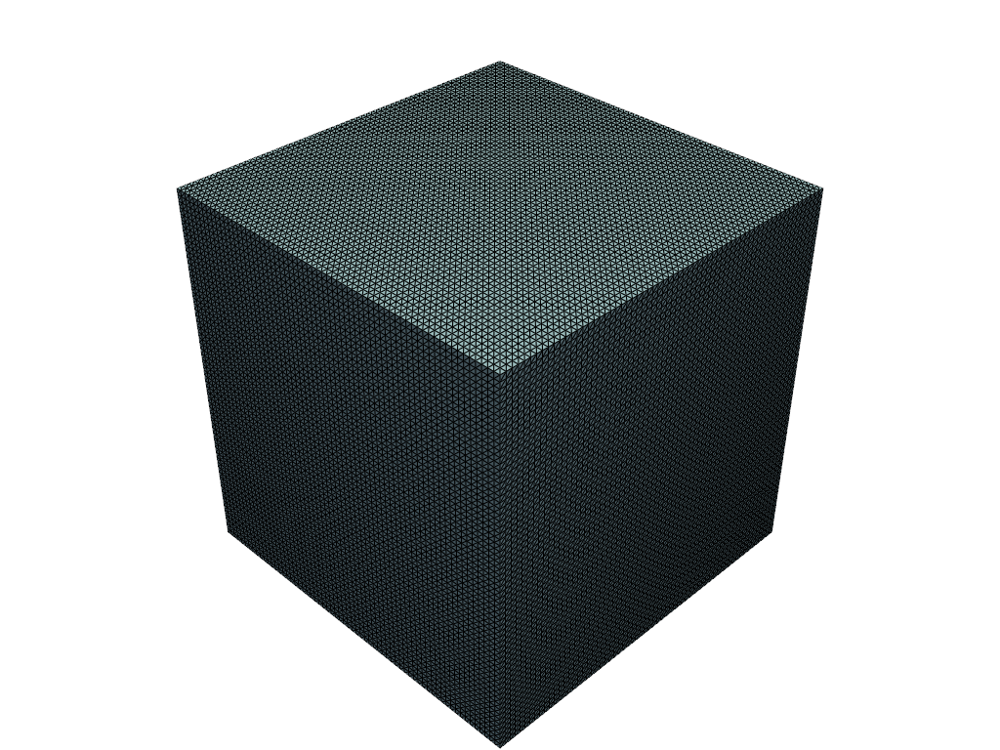

In [11]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.isometric_view_interactive()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


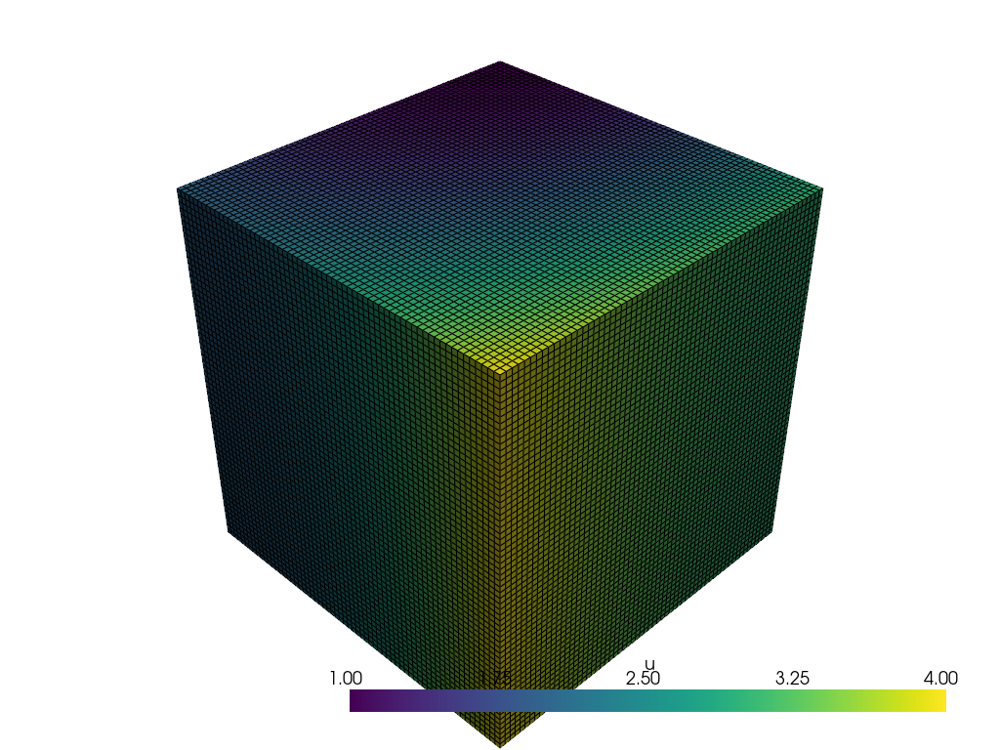

In [12]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.isometric_view_interactive()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [44]:
geometry.T[0].shape

(289,)

In [13]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [54]:
!ls ../Data

In [14]:
dd.to_csv("../Data/3D_poisson_eq_Dirichlet_BC_64x64x64.csv")

# Dirichlet F linear-Constant

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=x$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [17]:
from mpi4py import MPI
from dolfinx import mesh
domain = mesh.create_unit_cube(MPI.COMM_WORLD, 64, 64, 64, mesh.CellType.hexahedron)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: x[0])

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [18]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


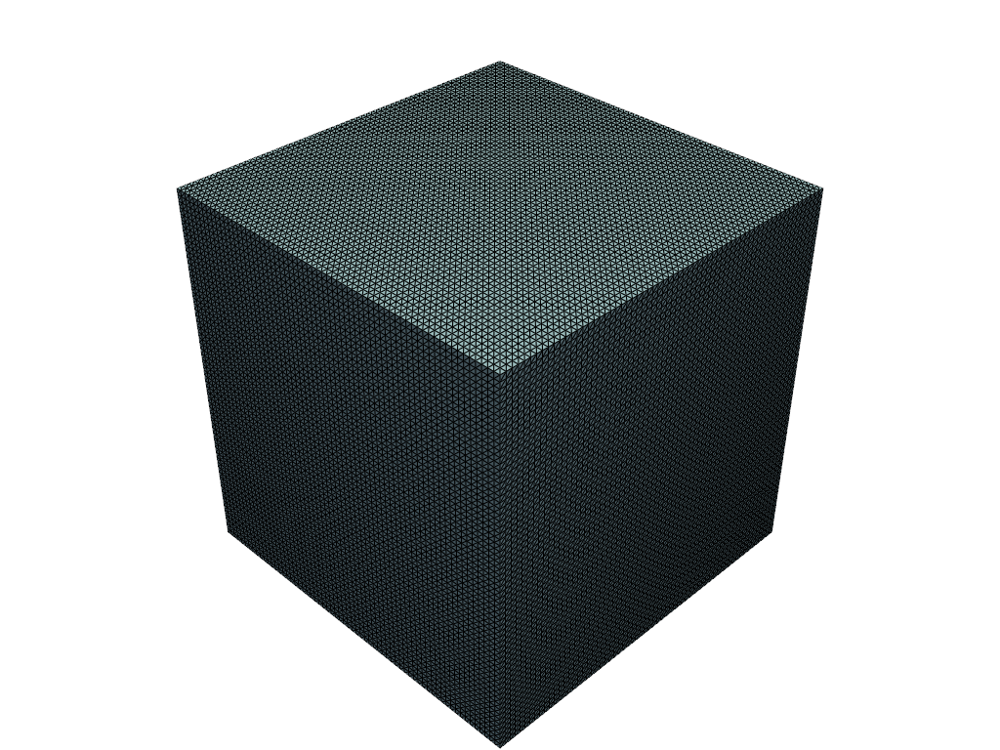

In [19]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_isometric()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


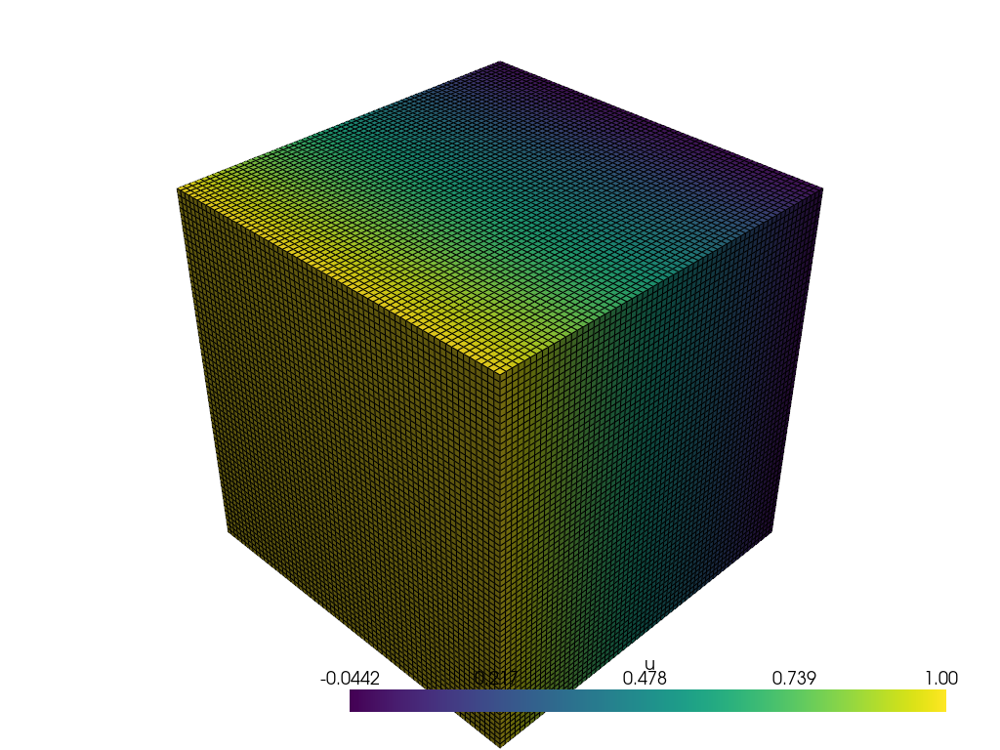

In [20]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
plotter.view_isometric()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [21]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [23]:
dd.to_csv("../Data/3D_poisson_eq_Dirichlet_Const_Linear_f_Const_64x64.csv")

# Dirichlet F Linear-Linear

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=1+x+2y$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [25]:
from mpi4py import MPI
from dolfinx import mesh
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

In [26]:
from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: 1 + x[0] + 2 * x[1])

In [27]:
import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

In [28]:
import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

In [29]:
from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

In [30]:
from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [31]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


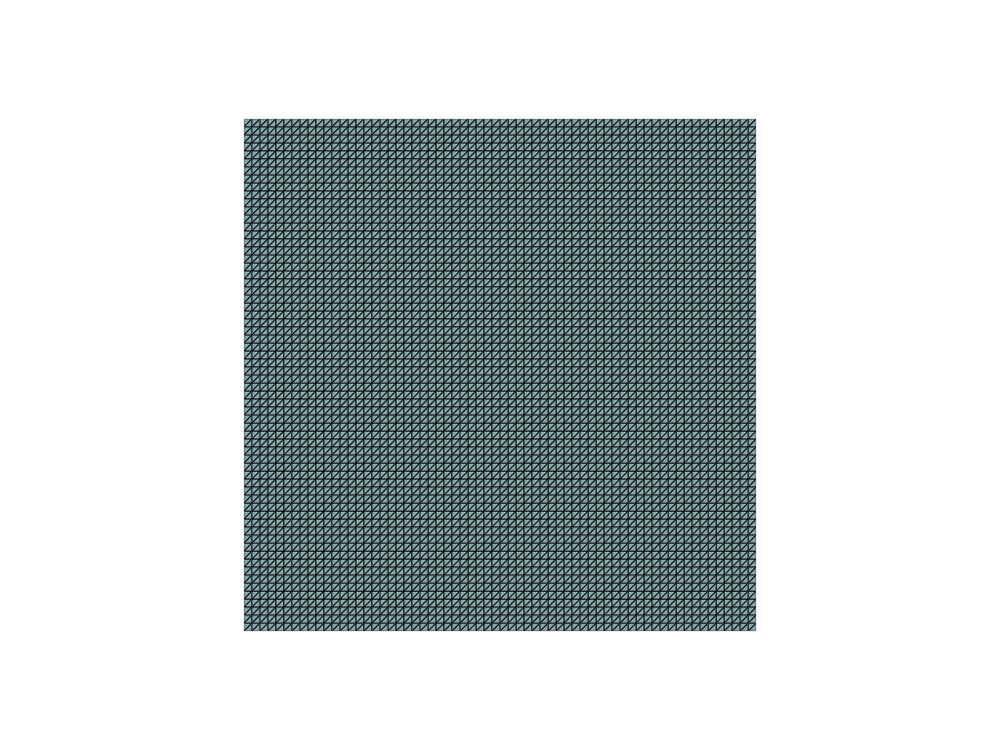

In [32]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


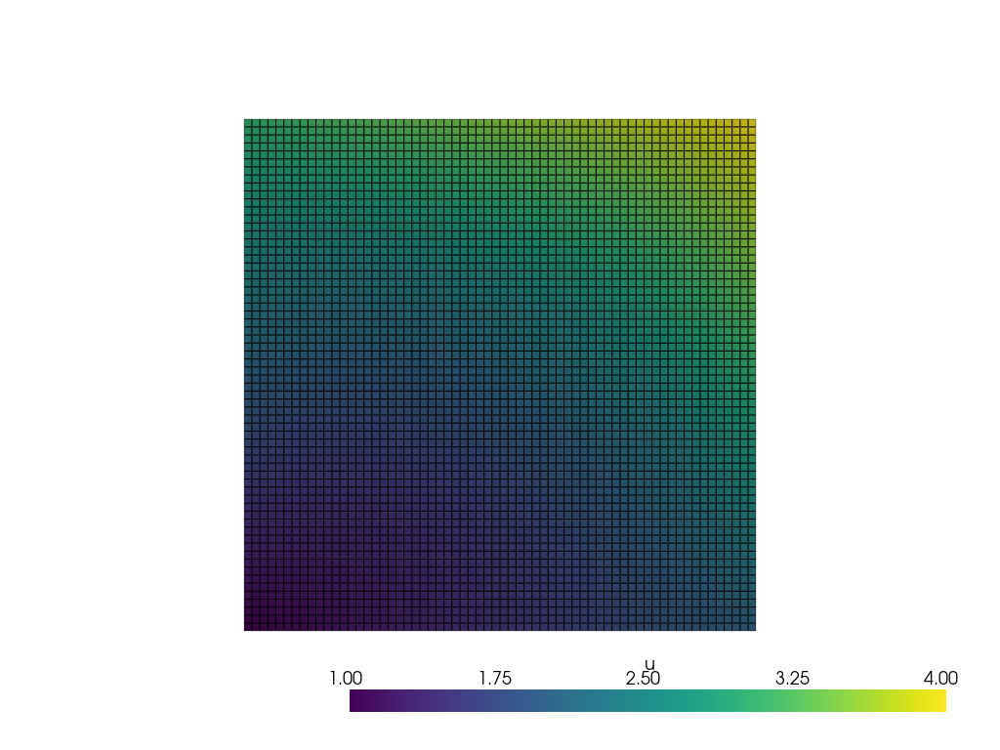

In [33]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [34]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [36]:
dd.to_csv("../Data/2D_poisson_eq_Dirichlet_Linear_Linear_f_Const_64x64.csv")

# Dirichlet F Quadratic-Constant

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=y^2+6$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [57]:
from mpi4py import MPI
from dolfinx import mesh
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: 6+(0.5-x[1])**2)

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [58]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


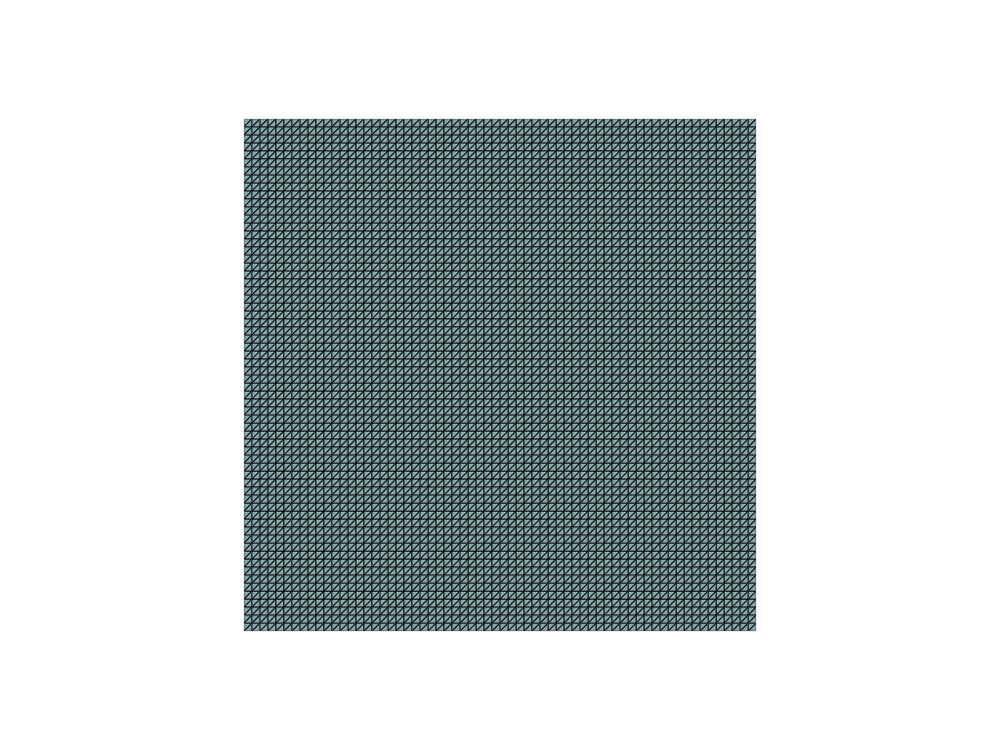

In [59]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


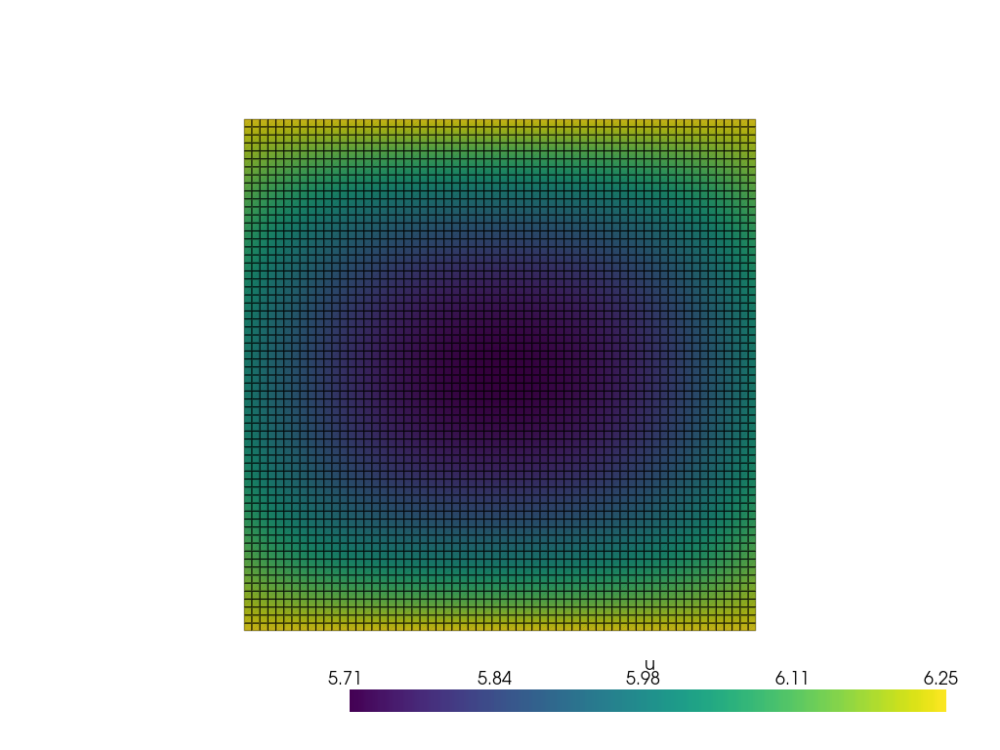

In [60]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [61]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [62]:
dd.to_csv("../Data/2D_poisson_eq_Dirichlet_Const_Quad_f_Const_64x64.csv")

# Dirichlet F linear-Quadratic

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=x+y^2$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [67]:
from mpi4py import MPI
from dolfinx import mesh
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: x[0]+(x[1]-0.5)**2)

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [68]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


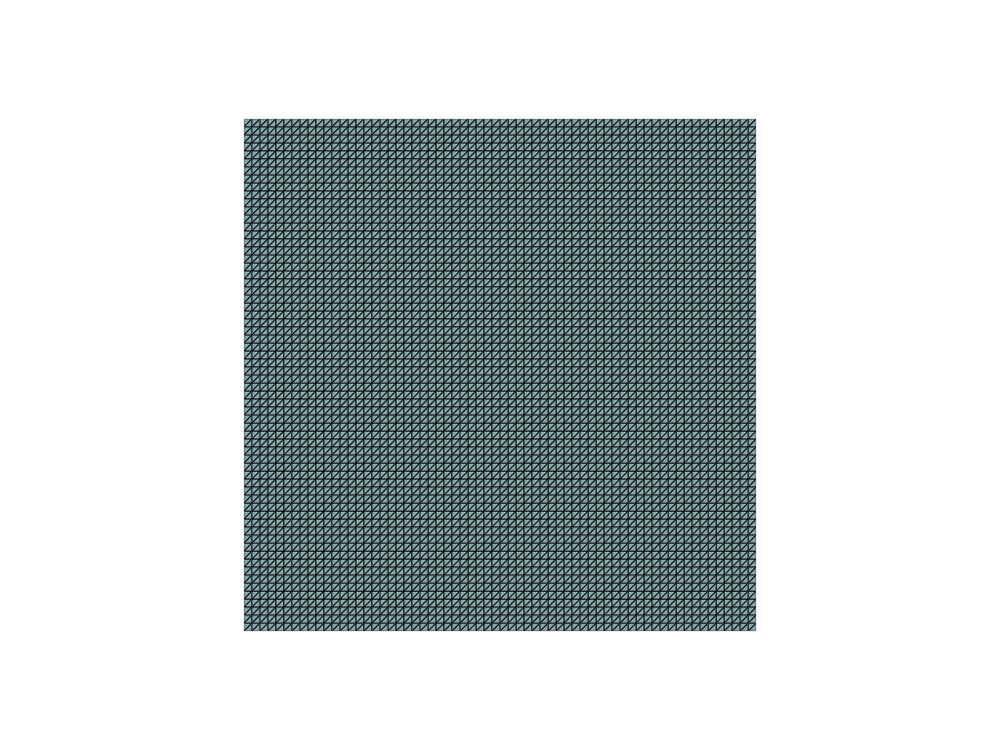

In [69]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


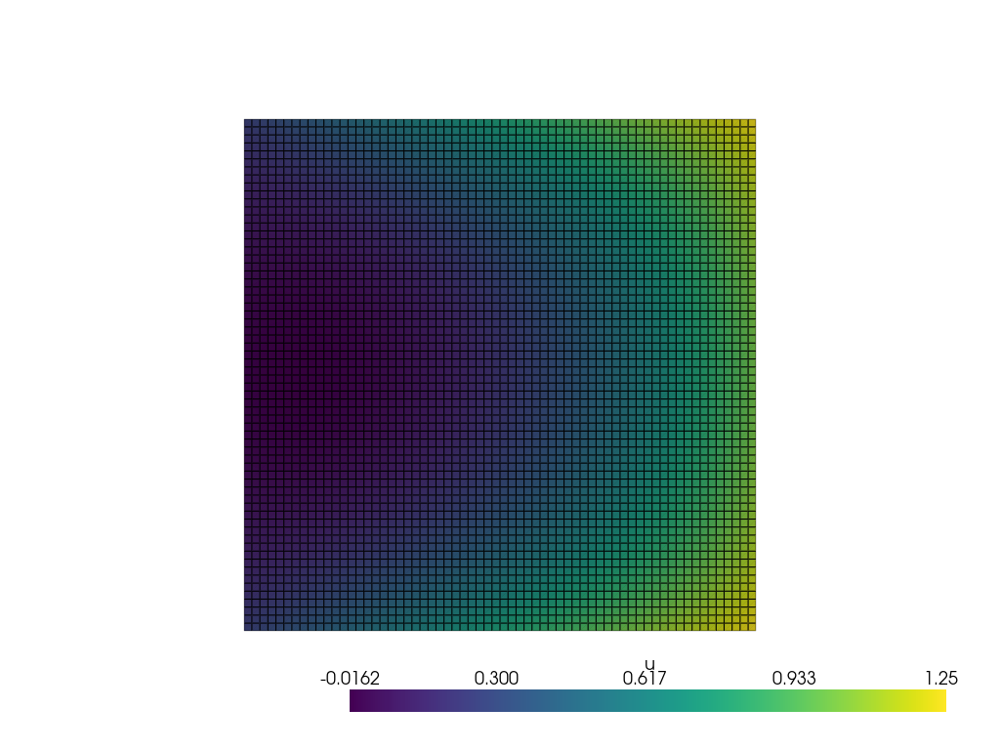

In [70]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [71]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [72]:
dd.to_csv("../Data/2D_poisson_eq_Dirichlet_Const_Quad_f_Const_64x64.csv")

# Dirichlet F Quadratic-Quadratic

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=(x-0.5)^2+(y-0.5)^2$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [73]:
from mpi4py import MPI
from dolfinx import mesh
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: (x[0]-0.5)**2+(x[1]-0.5)**2)

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [74]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


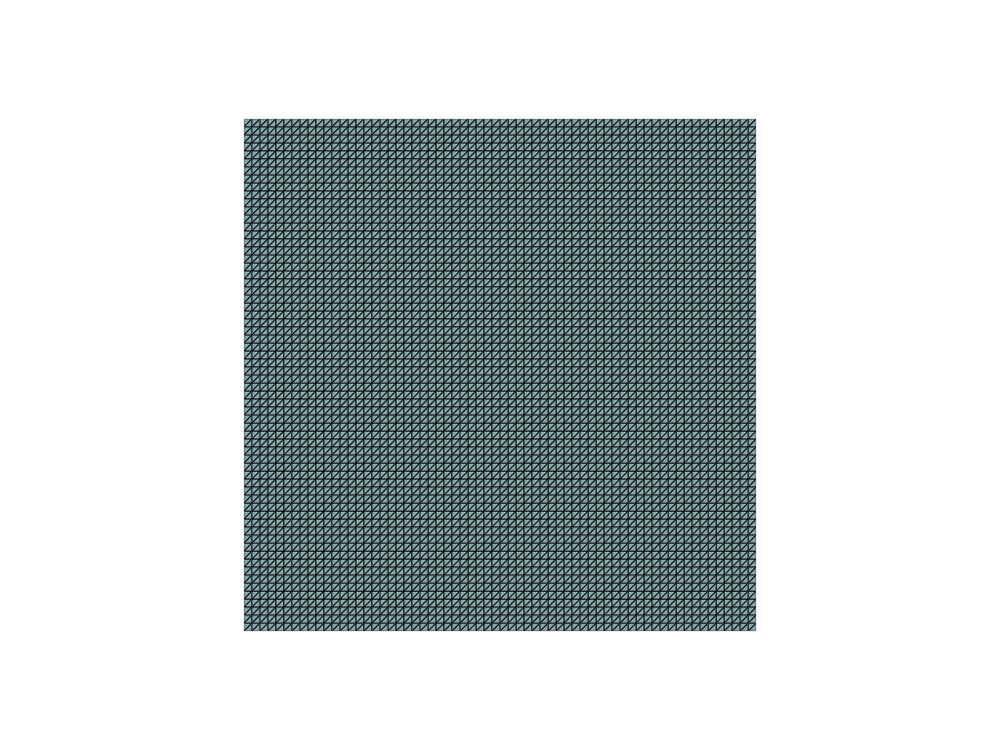

In [75]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


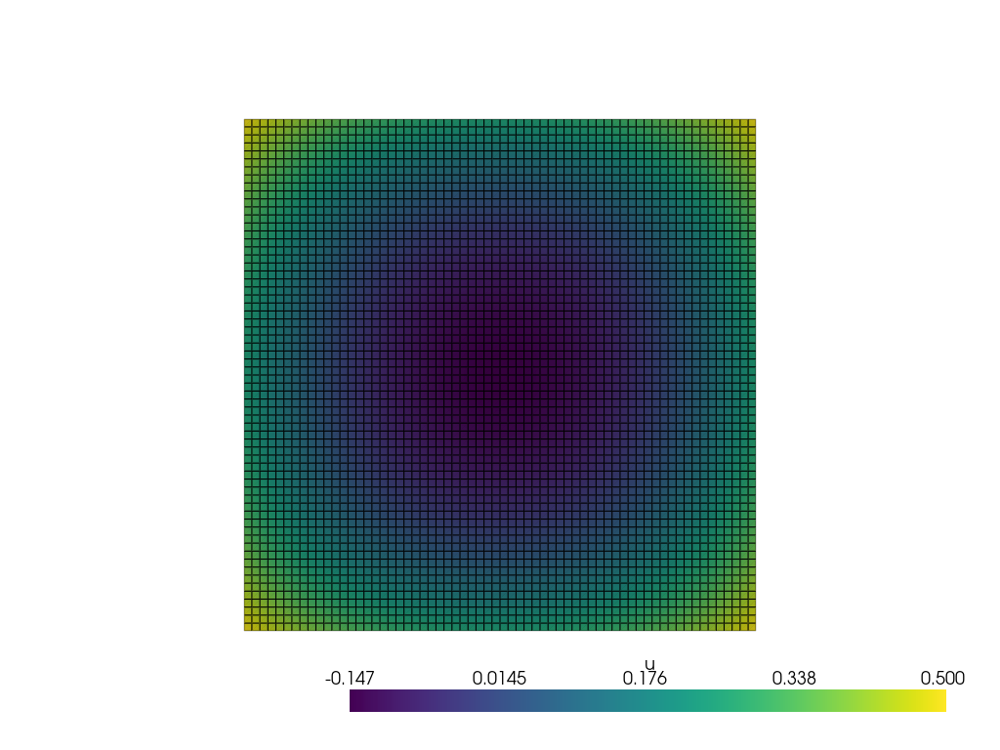

In [76]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [77]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [78]:
dd.to_csv("../Data/2D_poisson_eq_Dirichlet_Quad_Quad_f_Const_64x64.csv")

# Dirichlet F Exponential-Exponential

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=e^{-(x-0.5)^2} + e^{-(y-0.5)^2}$$
$$f(x,y)=-6$$


## Solution with 8x8 grid

In [82]:
from mpi4py import MPI
from dolfinx import mesh
import numpy as np
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: np.exp(-1*((x[0]-0.5)**2+(x[1]-0.5)**2)))

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

import ufl
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)


from dolfinx import default_scalar_type
f = fem.Constant(domain, default_scalar_type(-6))

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [83]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


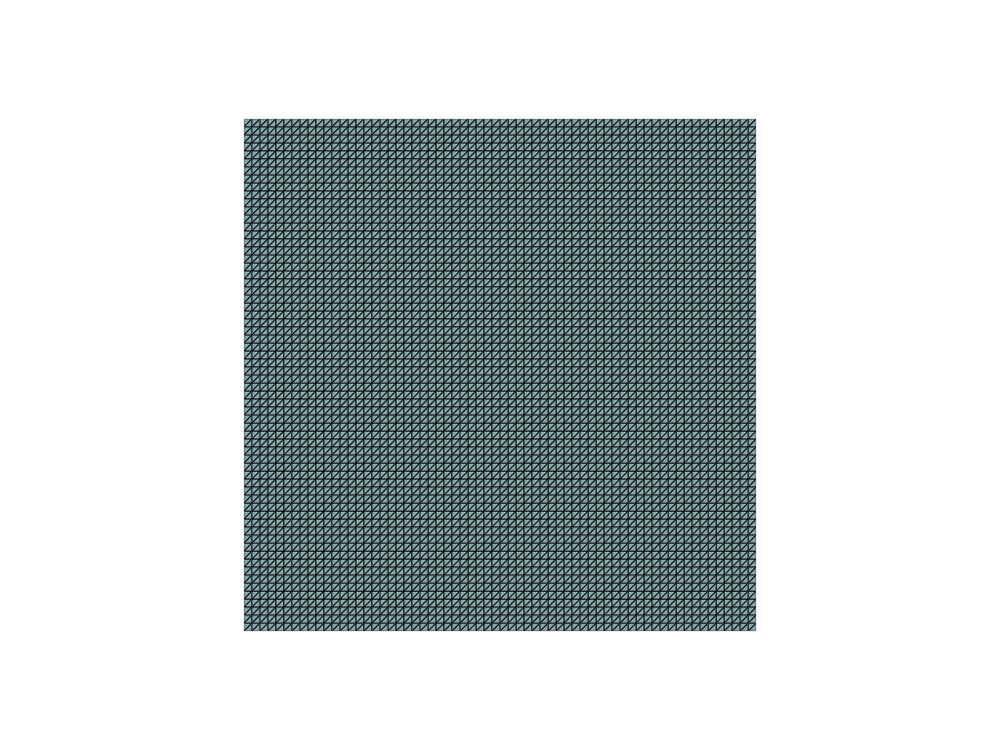

In [84]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


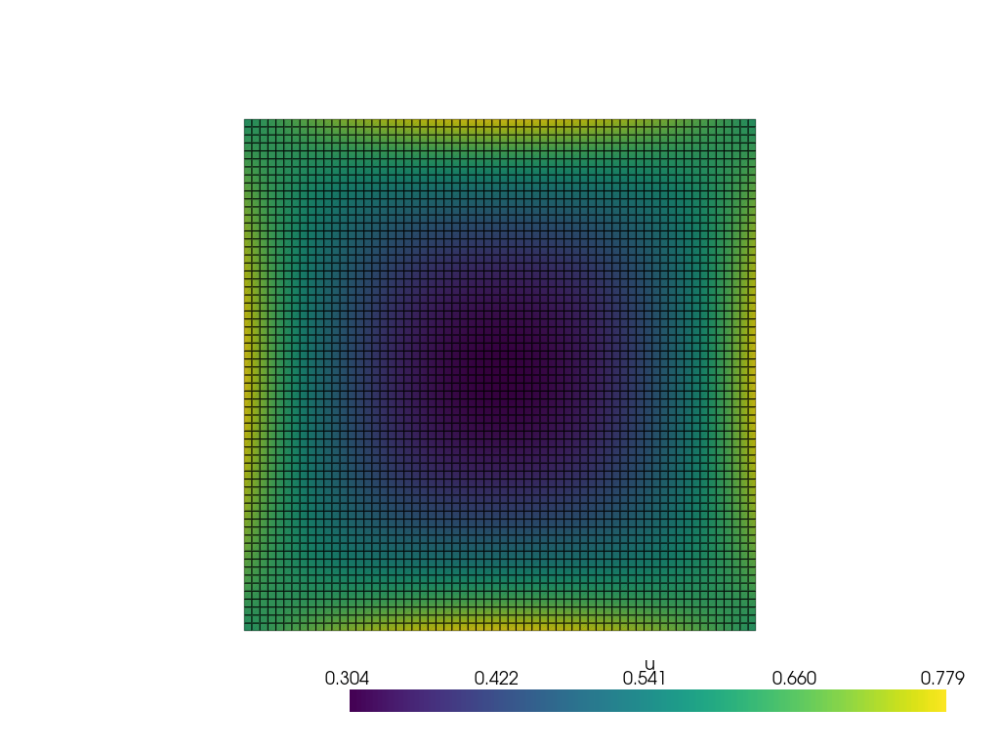

In [85]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [87]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [88]:
dd.to_csv("../Data/2D_poisson_eq_Dirichlet_Exp_Exp_f_Const_64x64.csv")

# Dirichlet: Exponential-Exponential - F: linear

## Equations

$$-\nabla^2 u(\mathbf{x})=f(\mathbf{x}) \ \mathbf{x} \in \Omega$$
$$u(\mathbf{x})=u_D(\mathbf{x}) \ \mathbf{x} \in \Omega$$


$$\mathbf{x}=[x,y] \ \Omega: [0,1]\times[0,1]$$

$$u_D(x,y)=e^{-(x-0.5)^2} + e^{-(y-0.5)^2}$$
$$f(x,y)=x+y$$


## Solution with 8x8 grid

In [89]:
from mpi4py import MPI
from dolfinx import mesh
import numpy as np
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)

from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

from dolfinx import fem
uD = fem.Function(V)
uD.interpolate(lambda x: np.exp(-1*((x[0]-0.5)**2+(x[1]-0.5)**2)))

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)

import ufl
from ufl import Measure, SpatialCoordinate, TestFunctions, TrialFunctions, div, exp, inner
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

from dolfinx import default_scalar_type
x = SpatialCoordinate(domain)
f = x[0]+x[1]

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=[bc], petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [90]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


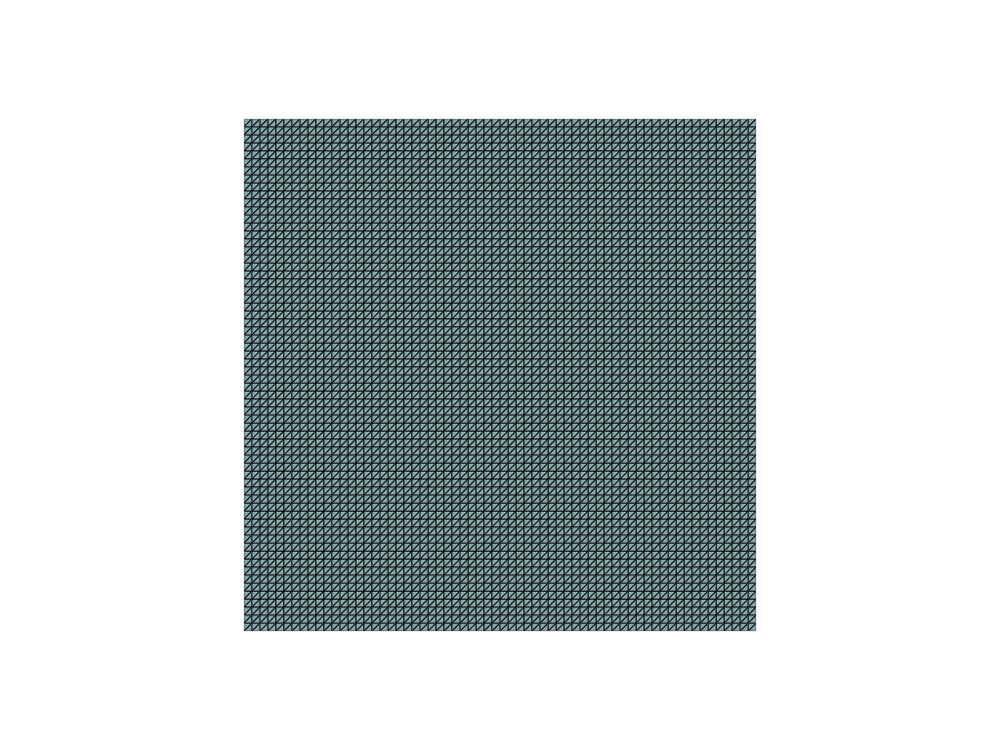

In [91]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


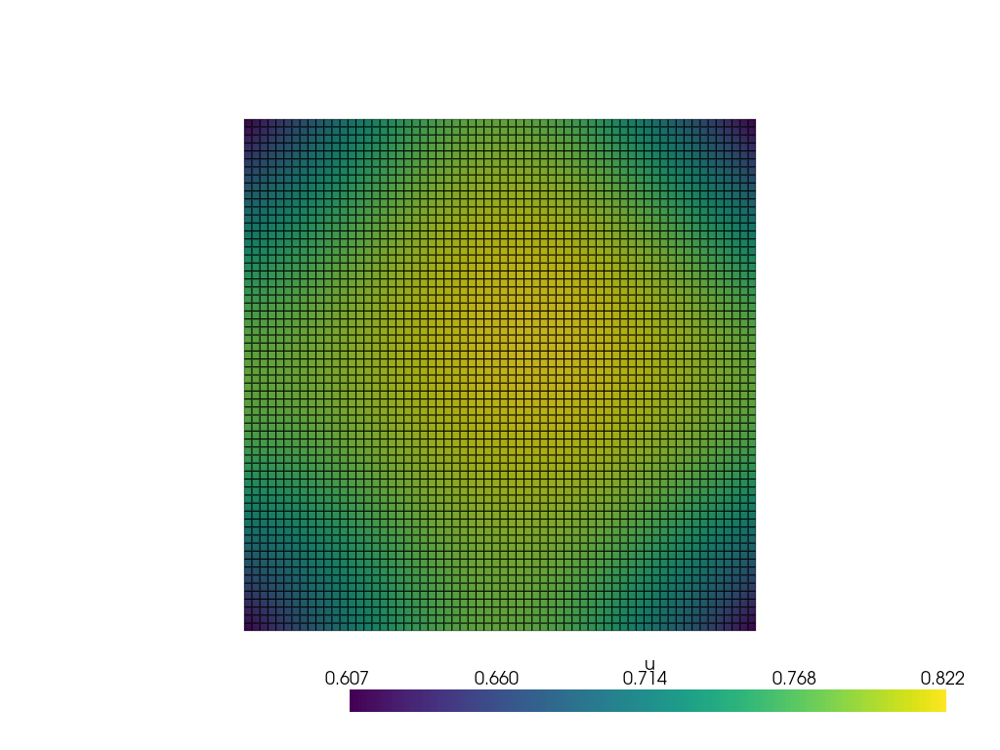

In [92]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [93]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)



In [94]:
dd.to_csv("../Data/2D_poisson_eq_Dirichlet_Exp_Exp_f_Linear_Linear_64x64.csv")

# Boundary Conditions: Dirichlet Neumann Robin: Exponential-Exponential - F: linear

In [15]:
from mpi4py import MPI
from dolfinx import mesh
import ufl
import numpy as np
from dolfinx import fem

class BoundaryCondition():
    def __init__(self, type, marker, values, ds,facet_tag):
        self._type = type
        if type == "Dirichlet":
            u_D = fem.Function(V)
            u_D.interpolate(values)
            facets = facet_tag.find(marker)
            dofs = fem.locate_dofs_topological(V, fdim, facets)
            self._bc = fem.dirichletbc(u_D, dofs)
        elif type == "Neumann":
                self._bc = ufl.inner(values, v) * ds(marker)
        elif type == "Robin":
            self._bc = values[0] * ufl.inner(u-values[1], v)* ds(marker)
        else:
            raise TypeError("Unknown boundary condition: {0:s}".format(type))
    @property
    def bc(self):
        return self._bc

    @property
    def type(self):
        return self._type

In [17]:
from mpi4py import MPI
from dolfinx import mesh
import ufl
import numpy as np
domain = mesh.create_unit_square(MPI.COMM_WORLD, 64, 64, mesh.CellType.quadrilateral)
 
from dolfinx.fem import functionspace
V = functionspace(domain, ("Lagrange", 1))

tdim = domain.topology.dim
fdim = tdim - 1

boundaries=[
    (1, lambda x: np.isclose(x[0],0)),
    (2, lambda x: np.isclose(x[0],1)),
    (3, lambda x: np.isclose(x[1],0)),
    (4, lambda x: np.isclose(x[1],1))
]

facet_indices,facet_markers=[],[]
for (marker, locator) in boundaries:
    facets= mesh.locate_entities(domain,fdim,locator)
    facet_indices.append(facets)
    facet_markers.append(np.full_like(facets,marker))
facet_indices=np.hstack(facet_indices).astype(np.int32)
facet_markers=np.hstack(facet_markers).astype(np.int32)
sorted_facets=np.argsort(facet_indices)
facet_tag=mesh.meshtags(domain,fdim,facet_indices[sorted_facets],facet_markers[sorted_facets])

ds=ufl.Measure('ds',domain=domain,subdomain_data=facet_tag)
    

from dolfinx import fem
#uD = fem.Function(V)
#uD.interpolate(lambda x: np.exp(-1*((x[0]-0.5)**2+(x[1]-0.5)**2)))

import numpy
# Create facet to cell connectivity required to determine boundary facets
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)
boundary_facets = mesh.exterior_facet_indices(domain.topology)

boundary_dofs = fem.locate_dofs_topological(V, fdim, boundary_facets)
bc = fem.dirichletbc(uD, boundary_dofs)


from ufl import Measure, SpatialCoordinate, TestFunctions, TrialFunctions, div, exp, inner
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)

from dolfinx import default_scalar_type
x = SpatialCoordinate(domain)
n = ufl.FacetNormal(domain)
f = x[0]+x[1]

u_ex=lambda x: 1 + x[0]**2 + 2*x[1]**2
r=fem.Constant(domain, default_scalar_type(1000))
s=u_ex(x)
g=-ufl.inner(n, ufl.grad(u_ex(x)))

boundary_conditions = [BoundaryCondition("Dirichlet", 1, u_ex,ds,facet_tag),
                       BoundaryCondition("Dirichlet", 2, u_ex,ds,facet_tag),
                       BoundaryCondition("Robin", 3, (r, s),ds,facet_tag),
                       BoundaryCondition("Neumann", 4, g,ds,facet_tag)]

a = ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx
F=a+L
bcs = []
for condition in boundary_conditions:
    if condition.type == "Dirichlet":
        bcs.append(condition.bc)
    else:
        F += condition.bc

a = ufl.lhs(F)
L = ufl.rhs(F)

from dolfinx.fem.petsc import LinearProblem
problem = LinearProblem(a, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [18]:
import pyvista
print(pyvista.global_theme.jupyter_backend)

from dolfinx import plot
pyvista.start_xvfb()
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


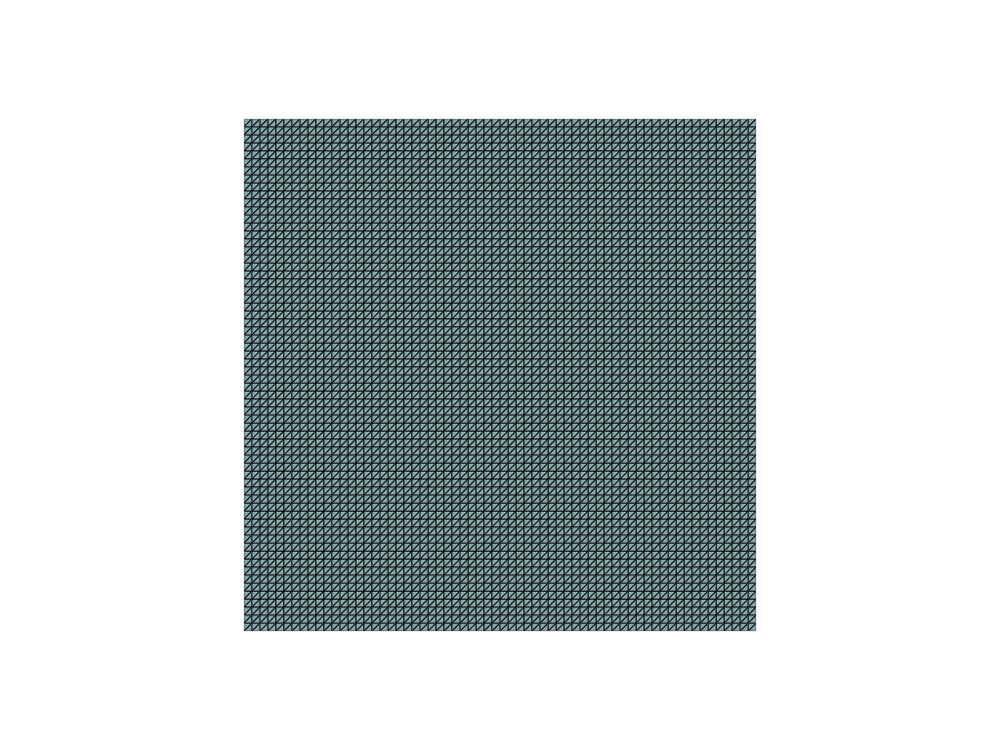

In [19]:
plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


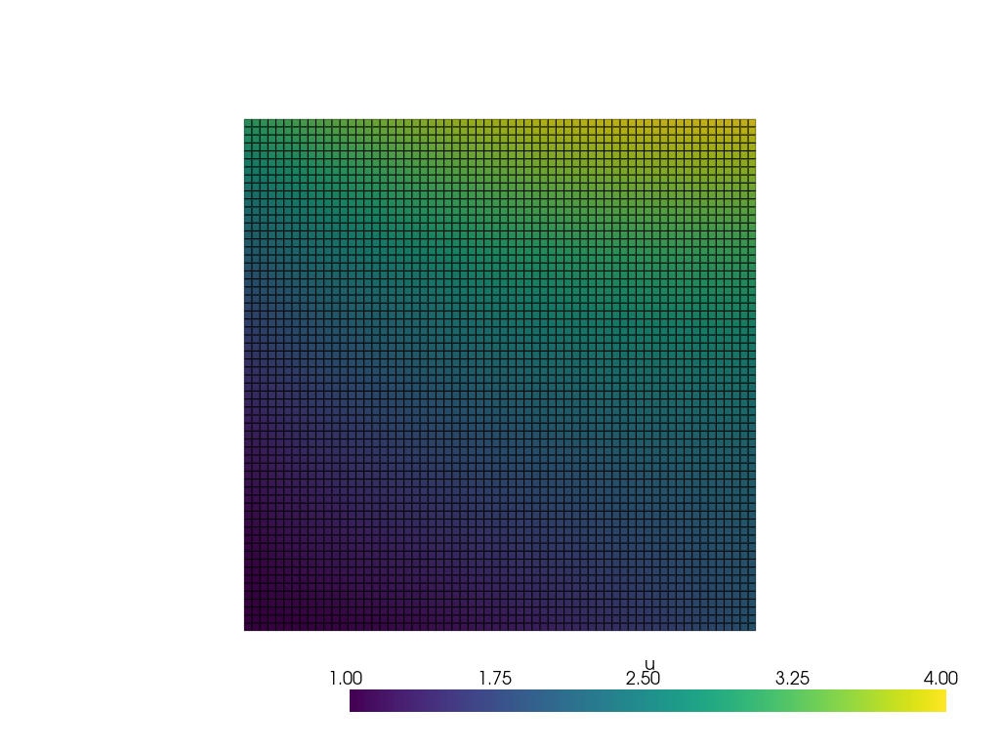

In [20]:
u_topology, u_cell_types, u_geometry = plot.vtk_mesh(V)

u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [24]:
dd=solution_data_normalization(u=uh.x.array.real,
                            X=geometry.T,
                            t=None)

In [25]:
dd.to_csv("../Data/2D_poisson_eq_D_N_R_quad_f_Linear_Linear_64x64.csv")